# 📌 Submission Guidelines

### ✅ File Naming Rule  
Submit your notebook with the following format:

`StudentID_YourFullName_LABXX.ipynb`

or

`StudentID_YourFullName_LABXX.html`

**Examples (Correct):**
- `21113456_NguyenVanA_LAB01.ipynb`
- `19122233_TranThiB_LAB02.ipynb`

**Examples (Wrong → 0 points):**
- `Lab01.ipynb`
- `YourName.ipynb`
- `20123456.ipynb`
- `Lab01.pdf`

---

### 📌 Grading Policy

- ❌ Wrong filename format, missing submission, or **plagiarism (code identical to others)** → 0 points

- ⚠️ Submitting a file without results, incomplete work, or only the assignment description → Maximum 4 points

- ✅ Correct filename + Completed results → Graded normally based on assignment quality (accuracy, clarity, and originality)  

### Note:
- AI assistance is allowed, but you must write the code yourself. All submissions will be checked for originality.


---

#🎯 Goal

The goal of this section is to understand how the Fourier Transform decomposes an image into its frequency components. By the end of this lesson, you will be able to:

- Explain the concept of frequency domain representation and how it relates to the spatial domain.

- Apply the 2D Discrete Fourier Transform (DFT) to an image using computational tools.

- Visualize and interpret the magnitude and phase spectra of an image.

- Understand how low-pass and high-pass filters can be designed and applied in the frequency domain for image smoothing and edge enhancement.

- Relate the mathematical formulation of Fourier Transform to its practical applications in image processing, such as denoising, sharpening, and feature extraction.



# Code Sample

[For more detail: Image Fourier Transform](https://www.bogotobogo.com/python/OpenCV_Python/python_opencv3_Image_Fourier_Transform_FFT_DFT.php)

In [1]:
import numpy as np
import pandas as pd
import cv2 as cv
from matplotlib import pyplot as plt
import matplotlib.cm as cm
import matplotlib.gridspec as gridspec
from pylab import imread
from skimage.color import rgb2gray

In [2]:
def imshows(ImageData, LabelData, rows, cols, gridType = False):
  # Convert ImageData and LabelData to List
  ImageArray = list(ImageData)
  LabelArray = list(LabelData)
  if(rows == 1 & cols == 1):
    fig = plt.figure(figsize=(20,20))
  else:
    fig = plt.figure(figsize=(cols*8,rows*5))

  for i in range(1, cols * rows + 1):
      fig.add_subplot(rows, cols, i)
      image = ImageArray[i - 1]
      # If the channel number is less than 3, we display as grayscale image
      # otherwise, we display as color image
      if (len(image.shape) < 3):
          plt.imshow(image, plt.cm.gray)
          plt.grid(gridType)
      else:
          plt.imshow(image)
          plt.grid(gridType)
      plt.title(LabelArray[i - 1])
  plt.show()

def ShowFourImages(IM1, IM2, IM3, IM4):
    imshows([IM1, IM2, IM3, IM4], ["Image 1","Image 2", "Image 3", "Image 4"], 2, 2)
def ShowThreeImages(IM1, IM2, IM3):
    imshows([IM1, IM2, IM3], ["Image 1","Image 2", "Image 3"], 1, 3)
def ShowTwoImages(IM1, IM2):
    imshows([IM1, IM2], ["Image 1","Image 2"], 1, 2)
def ShowOneImage(IM):
    imshows([IM], ["Image"], 1, 1)
def ShowListImages(listImage, row, col):
    listCaption = []
    for i in range(len(listImage)):
        listCaption.append(str(i))
    imshows(listImage,listCaption,row,col)

In [3]:
!gdown 14jFMU9rwO6yVKa_v6gTof98bTB4VKS_4
!gdown 1GytvArvIOjdh-Nk-KZ4Xz9jxgx7yiFJY
!gdown 1T4RbBOEagTS4yAZojql56t6qBcCy2s3O
!gdown 19RwaoAHr9K3OHm1o98LHhBR5Aim1NkC1

Downloading...
From: https://drive.google.com/uc?id=14jFMU9rwO6yVKa_v6gTof98bTB4VKS_4
To: d:\Xu_ly_anh\(5-1).jpeg

  0%|          | 0.00/62.2k [00:00<?, ?B/s]
100%|██████████| 62.2k/62.2k [00:00<00:00, 164kB/s]
100%|██████████| 62.2k/62.2k [00:00<00:00, 163kB/s]
Downloading...
From: https://drive.google.com/uc?id=1GytvArvIOjdh-Nk-KZ4Xz9jxgx7yiFJY
To: d:\Xu_ly_anh\(5-2).jpeg

  0%|          | 0.00/140k [00:00<?, ?B/s]
100%|██████████| 140k/140k [00:00<00:00, 409kB/s]
100%|██████████| 140k/140k [00:00<00:00, 409kB/s]
Downloading...
From: https://drive.google.com/uc?id=1T4RbBOEagTS4yAZojql56t6qBcCy2s3O
To: d:\Xu_ly_anh\(5-3).jpeg

  0%|          | 0.00/135k [00:00<?, ?B/s]
100%|██████████| 135k/135k [00:00<00:00, 683kB/s]
100%|██████████| 135k/135k [00:00<00:00, 682kB/s]
Downloading...
From: https://drive.google.com/uc?id=19RwaoAHr9K3OHm1o98LHhBR5Aim1NkC1
To: d:\Xu_ly_anh\(5-4).jpeg

  0%|          | 0.00/63.8k [00:00<?, ?B/s]
100%|██████████| 63.8k/63.8k [00:00<00:00, 439kB/s]
100%|█████

In [4]:
img1_path = r"D:\Xu_ly_anh\(5-1).jpeg"
img2_path = r"D:\Xu_ly_anh\(5-2).jpeg"
img3_path = r"D:\Xu_ly_anh\(5-3).jpeg"
img4_path = r"D:\Xu_ly_anh\(5-4).jpeg"



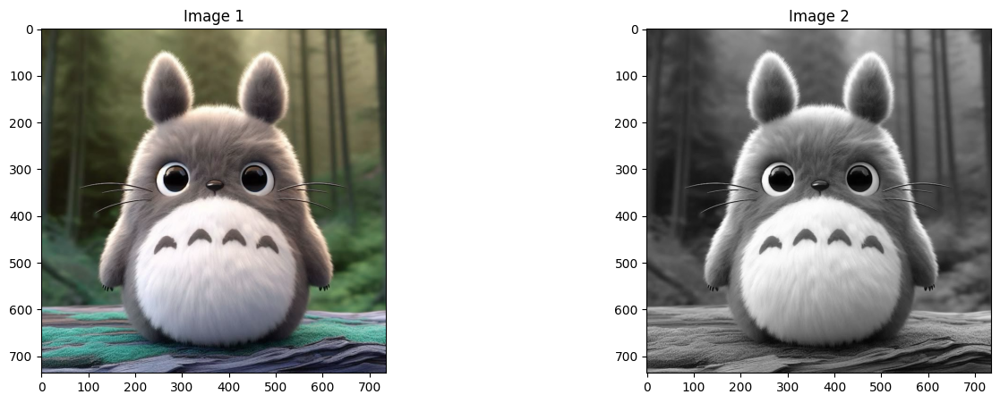

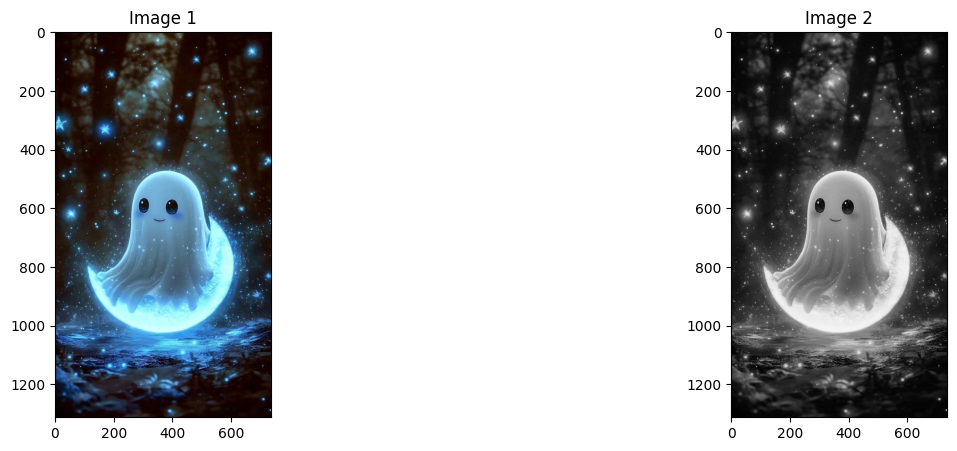

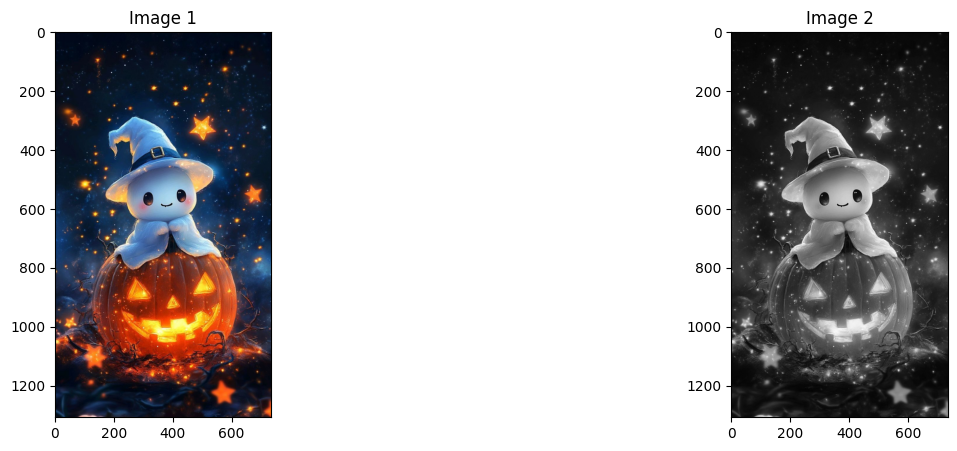

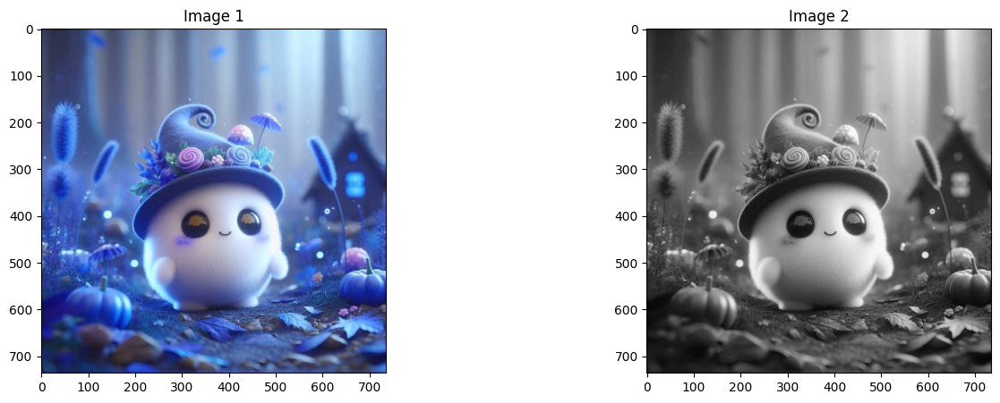

In [5]:
# Read Image
img1 = cv.imread(img1_path)
img2 = cv.imread(img2_path)
img3 = cv.imread(img3_path)
img3 = cv.cvtColor(img3, cv.COLOR_BGR2RGB)
img4 = cv.imread(img4_path)

# Convert Image into Gray
img1_gray = cv.cvtColor(img1, cv.COLOR_RGB2GRAY)
img2_gray = cv.cvtColor(img2, cv.COLOR_RGB2GRAY)
img3_gray = cv.cvtColor(img3, cv.COLOR_RGB2GRAY)
img4_gray = cv.cvtColor(img4, cv.COLOR_RGB2GRAY)

# Display Image
ShowTwoImages(img1, img1_gray)
ShowTwoImages(img2, img2_gray)
ShowTwoImages(img3, img3_gray)
ShowTwoImages(img4, img4_gray)

In [6]:
def Image3Dto2D(image):
    """
    Convert a 3D image (color) to a 2D image (grayscale).

    Parameters:
        image (ndarray): Input image, which can be 2D (grayscale) or 3D (color).

    Returns:
        image_2D (ndarray): Grayscale image as a 2D array.
    """
    # Check if the image has at least 3 dimensions (color image)
    if len(image.shape) >= 3:
        # Convert the 3D color image to grayscale using OpenCV's cvtColor function
        image_2D = cv.cvtColor(image, cv.COLOR_RGB2GRAY)
    else:
        # If the image is already 2D (grayscale), create a copy of it
        image_2D = image.copy()

    return image_2D


## Discrete Fourier Transform (DFT)




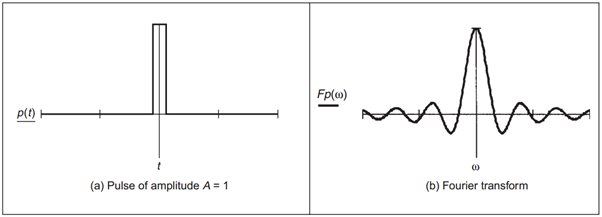

The Fourier Transform is a mathematical tool used to decompose a signal into its frequency components. In the case of image processing, the Fourier Transform can be used to analyze the frequency content of an image, which can be useful for tasks such as image filtering and feature extraction. He stated that any periodic function could be expressed as a sum of infinite sines and cosines:

$$
f(x) = \frac{a_0}{2} + \sum_{n=1}^\infty a_n \cos(nx) + \sum_{n=1}^\infty b_n \sin(nx)
$$


Fourier Transform is a generalization of the complex Fourier Series. In image processing, we use the discrete 2D Fourier Transform with formulas:

$$
f(x, y) = \frac{1}{MN} \sum_{u=0}^{M-1} \sum_{v=0}^{N-1} F(u, v) \cdot e^{i 2 \pi \left( \frac{xu}{M} + \frac{yv}{N} \right)}
$$

$$
F(u, v) = \sum_{x=0}^{M-1} \sum_{y=0}^{N-1} f(x, y) \cdot e^{-i 2 \pi \left( \frac{xu}{M} + \frac{yv}{N} \right)}
$$
where:

- $f(x, y)$ represents the intensity value of the image at spatial position $(x, y)$.
- $F(u, v)$ represents the corresponding frequency domain value at coordinates $(u, v)$.
- $M, N$ denote the dimensions of the image (width and height).
- $e^{-i 2\pi \left(\frac{ux}{M} + \frac{vy}{N}\right)}$ represents the complex exponential basis function, which decomposes the image into its sinusoidal (frequency) components.

In [7]:
def DFT_Transformation(image):
    """
    Perform Discrete Fourier Transform (DFT) on an image and compute its magnitude spectrum.

    Parameters:
        image (ndarray): Input image, can be 2D (grayscale) or 3D (color).

    Returns:
        magnitude_spectrum (ndarray): The magnitude spectrum of the transformed image.
        dft_shift (ndarray): The shifted DFT result (frequency domain representation).
    """
    # Convert the image to 2D grayscale if it is a color image
    img = Image3Dto2D(image)

    # Convert the image to float32 format (required for DFT)
    img_float32 = np.float32(img)

    # Apply Discrete Fourier Transform (DFT) to the image
    dft = cv.dft(img_float32, flags=cv.DFT_COMPLEX_OUTPUT)

    # Shift the zero-frequency component to the center of the frequency domain
    dft_shift = np.fft.fftshift(dft)

    # Compute the magnitude spectrum (log-scaled for visualization)
    magnitude_spectrum = 20 * np.log(cv.magnitude(dft_shift[:, :, 0], dft_shift[:, :, 1]))

    return magnitude_spectrum, dft_shift


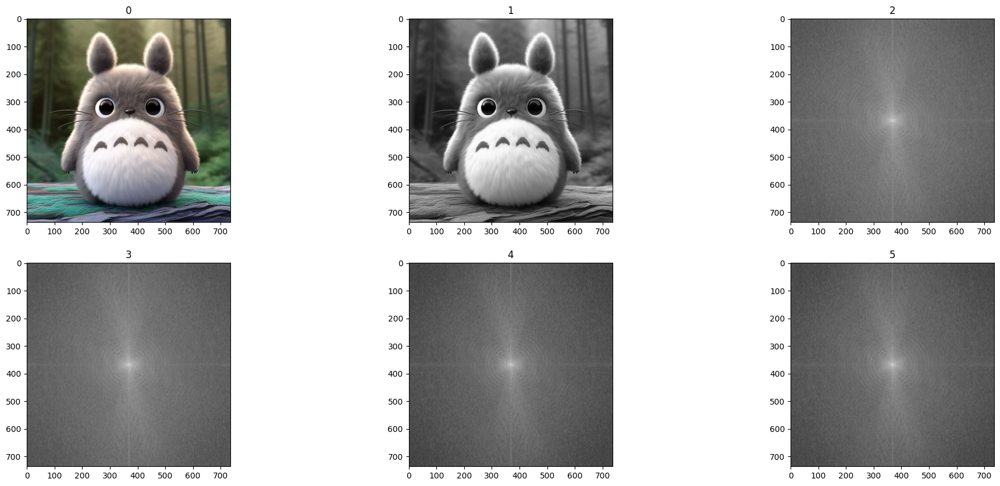

In [8]:
image_dft_frequency, dft_shift = DFT_Transformation(img1_gray)
image_dft_frequency1, dft_shift1 = DFT_Transformation(img1[:,:,0])
image_dft_frequency2, dft_shift2 = DFT_Transformation(img1[:,:,1])
image_dft_frequency3, dft_shift3 = DFT_Transformation(img1[:,:,2])
ShowListImages([img1, img1_gray,  image_dft_frequency, image_dft_frequency1, image_dft_frequency2, image_dft_frequency3], 2, 3)

In [9]:
image_dft_frequency,dft_shift = DFT_Transformation(img2_gray)
rows, cols = img2_gray.shape
crow,ccol = (int)(rows/2) , (int)(cols/2)

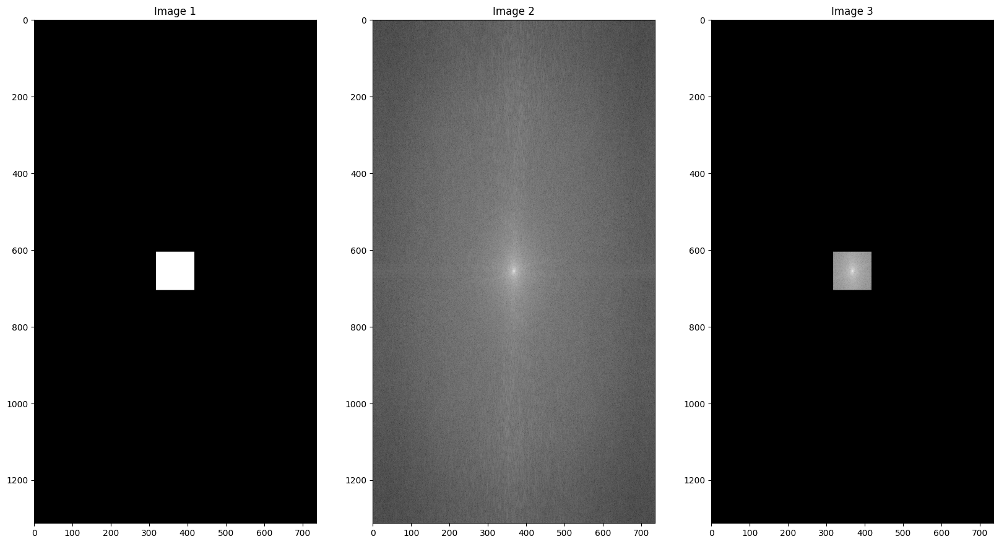

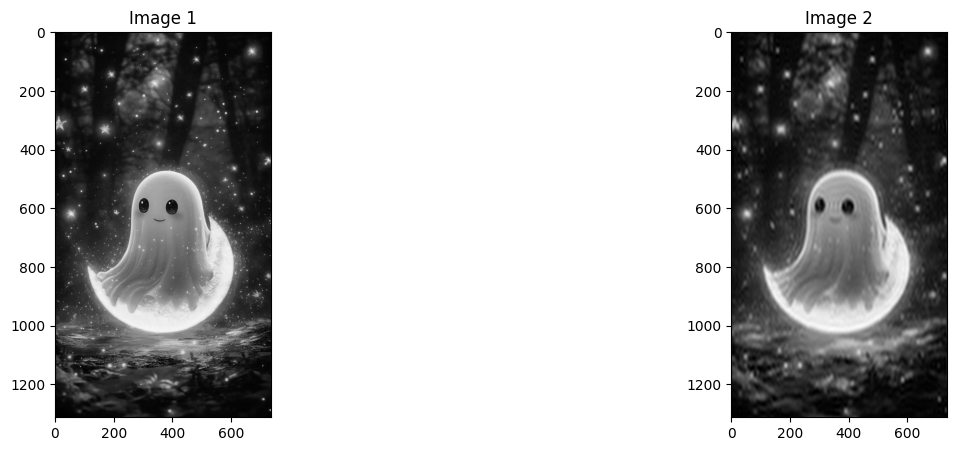

In [10]:
# create a mask first, center square is 1, remaining all zeros
mask = np.zeros((rows, cols, 2), np.uint8)
size = 50

mask[crow-size:crow+size, ccol-size:ccol+size] = 1
image_dft_frequency_crop = image_dft_frequency* mask[:,:,0]

# apply mask and inverse DFT
fshift = dft_shift * mask
f_ishift = np.fft.ifftshift(fshift)
img_inverse = cv.idft(f_ishift)
image_inverse = cv.magnitude(img_inverse[:,:,0],img_inverse[:,:,1])

ShowThreeImages(mask[:,:,0], image_dft_frequency, image_dft_frequency_crop)
ShowTwoImages(img2_gray, image_inverse)

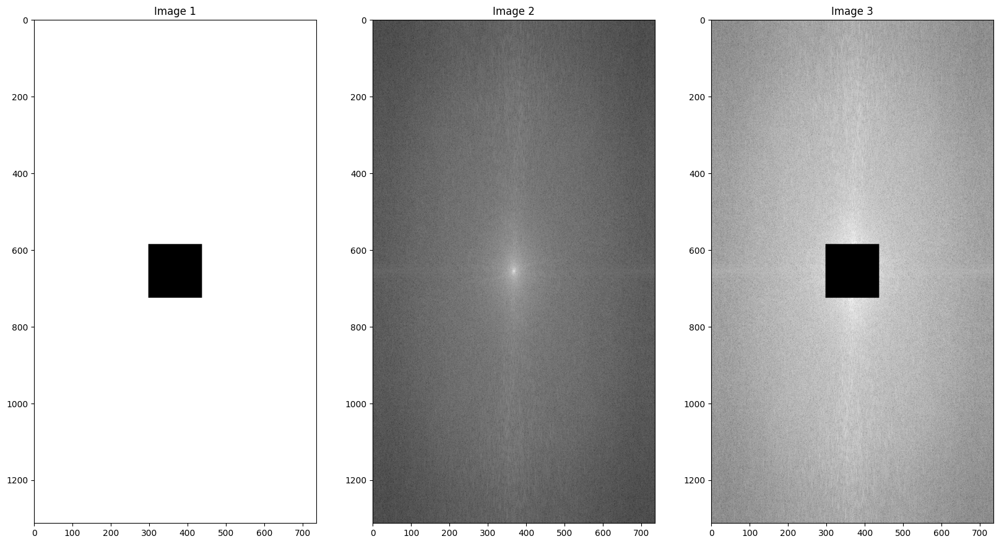

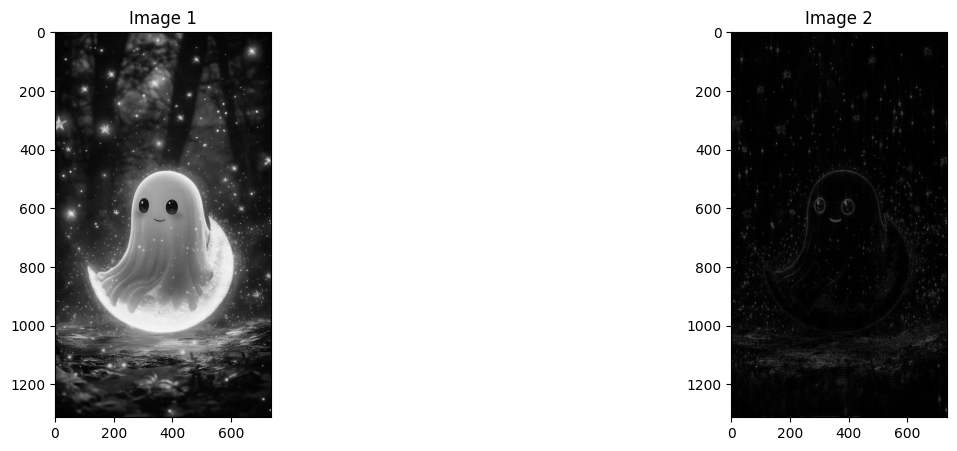

In [11]:
# create a mask first, center square is 1, remaining all zeros
mask = np.zeros((rows, cols, 2), np.uint8)
size = 70
mask[crow-size:crow+size, ccol-size:ccol+size] = 1
mask = 1 - mask
image_dft_frequency_crop = image_dft_frequency* mask[:,:,0]

# apply mask and inverse DFT
fshift = dft_shift*mask
f_ishift = np.fft.ifftshift(fshift)
img_inverse = cv.idft(f_ishift)
image_inverse = cv.magnitude(img_inverse[:,:,0],img_inverse[:,:,1])

ShowThreeImages(mask[:,:,0], image_dft_frequency, image_dft_frequency_crop)
ShowTwoImages(img2_gray, image_inverse)

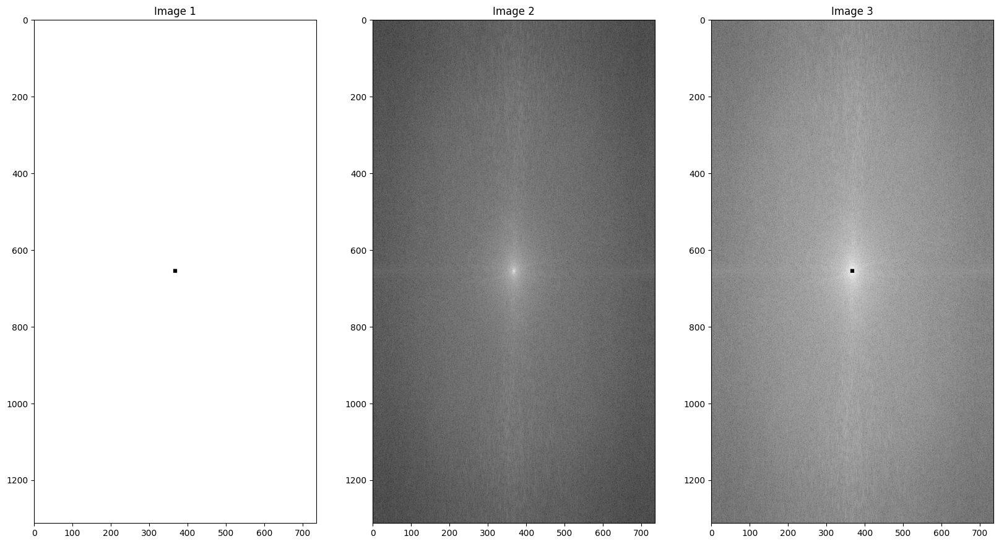

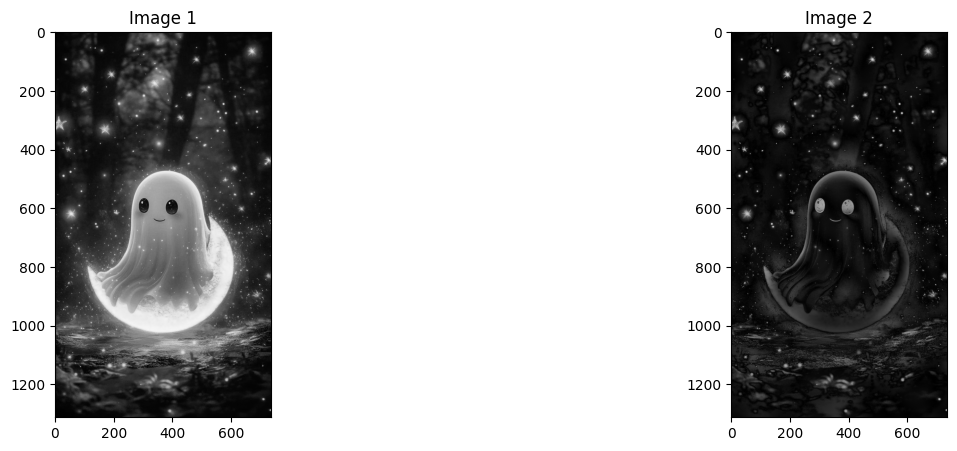

In [12]:
# create a mask first, center square is 1, remaining all zeros
mask = np.zeros((rows, cols, 2), np.uint8)
size = 5
mask[crow-size:crow+size, ccol-size:ccol+size] = 1
mask = 1 - mask
image_dft_frequency_crop = image_dft_frequency* mask[:,:,0]

# apply mask and inverse DFT
fshift = dft_shift*mask
f_ishift = np.fft.ifftshift(fshift)
img_inverse = cv.idft(f_ishift)
image_inverse = cv.magnitude(img_inverse[:,:,0],img_inverse[:,:,1])

ShowThreeImages(mask[:,:,0], image_dft_frequency, image_dft_frequency_crop)
ShowTwoImages(img2_gray, image_inverse)

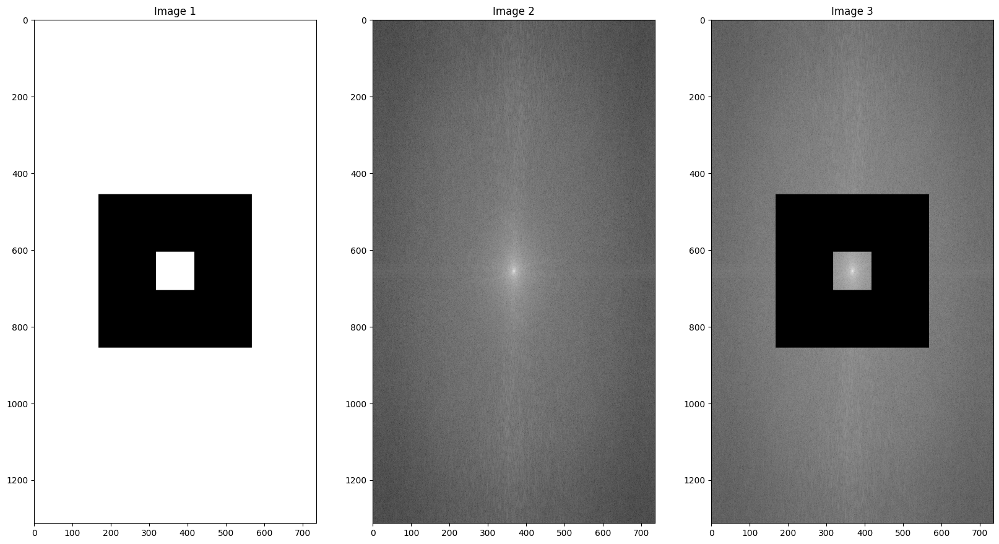

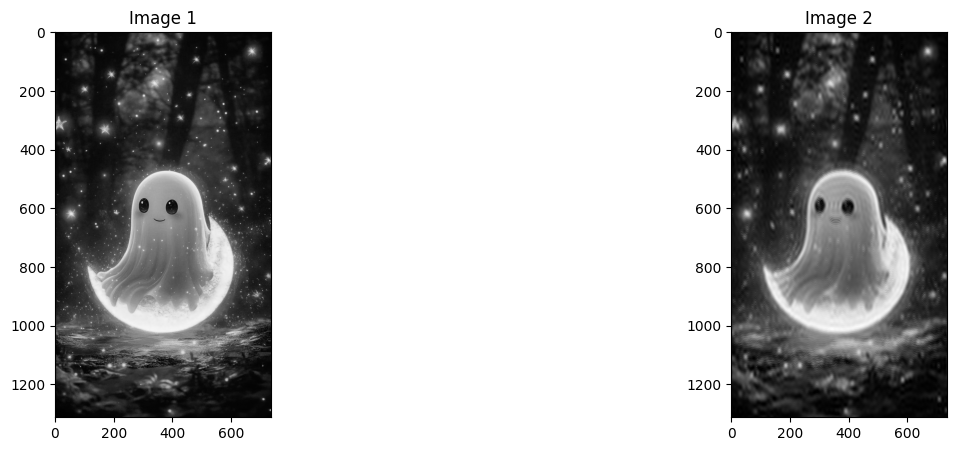

In [13]:
mask1 = np.zeros((rows, cols, 2), np.uint8)
mask2 = np.zeros((rows, cols, 2), np.uint8)

size = 50
mask1[crow-size:crow+size, ccol-size:ccol+size] = 1

size = 200
mask2[crow-size:crow+size, ccol-size:ccol+size] = 1


mask = np.zeros((rows, cols, 2), np.uint8)
mask[(mask1 == 1) | (mask2 == 0)] = 1

image_dft_frequency_crop = image_dft_frequency* mask[:,:,0]

# apply mask and inverse DFT
fshift = dft_shift*mask
f_ishift = np.fft.ifftshift(fshift)
img_inverse = cv.idft(f_ishift)
image_inverse = cv.magnitude(img_inverse[:,:,0],img_inverse[:,:,1])

ShowThreeImages(mask[:,:,0], image_dft_frequency, image_dft_frequency_crop)
ShowTwoImages(img2_gray, image_inverse)

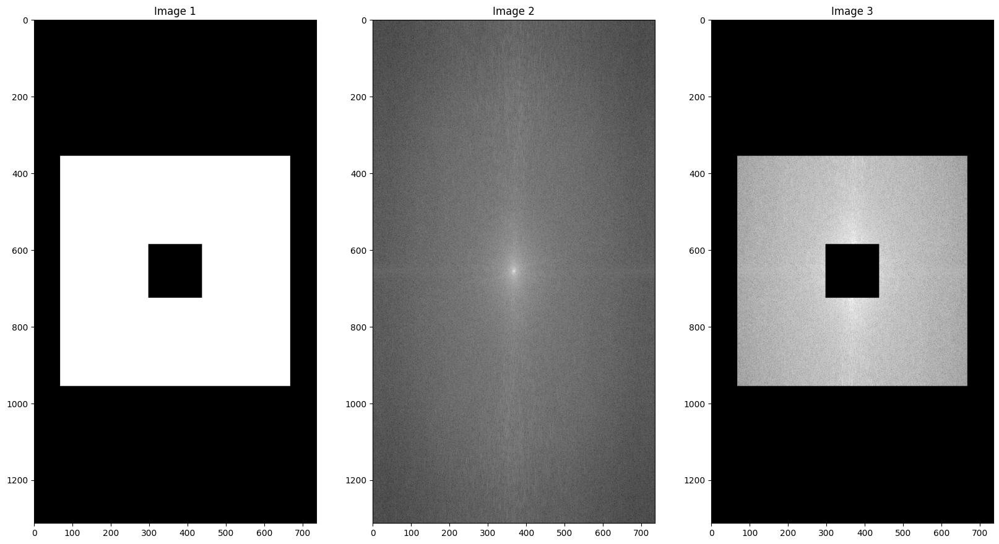

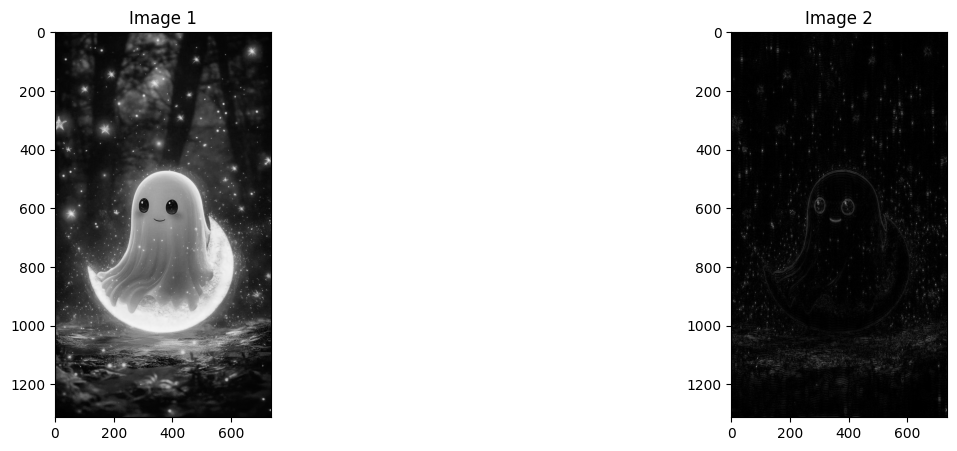

In [14]:
mask1 = np.zeros((rows, cols, 2), np.uint8)
mask2 = np.zeros((rows, cols, 2), np.uint8)

size = 70
mask1[crow-size:crow+size, ccol-size:ccol+size] = 1

size = 300
mask2[crow-size:crow+size, ccol-size:ccol+size] = 1


mask = np.zeros((rows, cols, 2), np.uint8)
mask[(mask2 == 1)] = 1
mask[(mask1 == 1)] = 0

image_dft_frequency_crop = image_dft_frequency* mask[:,:,0]

# apply mask and inverse DFT
fshift = dft_shift*mask
f_ishift = np.fft.ifftshift(fshift)
img_inverse = cv.idft(f_ishift)
image_inverse = cv.magnitude(img_inverse[:,:,0],img_inverse[:,:,1])

ShowThreeImages(mask[:,:,0], image_dft_frequency, image_dft_frequency_crop)
ShowTwoImages(img2_gray, image_inverse)

In [15]:
print(np.max(img2_gray), np.min(img2_gray))
print(np.max(image_inverse), np.min(image_inverse))

image_inverse = np.abs(image_inverse)

image_inverse = cv.normalize(image_inverse, None, 0, 255, cv.NORM_MINMAX)
image_inverse = np.uint8(image_inverse)

print(np.max(image_inverse), np.min(image_inverse))

253 0
177250300.0 2117.1765
255 0


Apply image
```python
cv.addWeighted()
```
Combine 2 image with the weights
$$ I_{out} = α \cdot I_{gray} + β \cdot I_{dft}$$


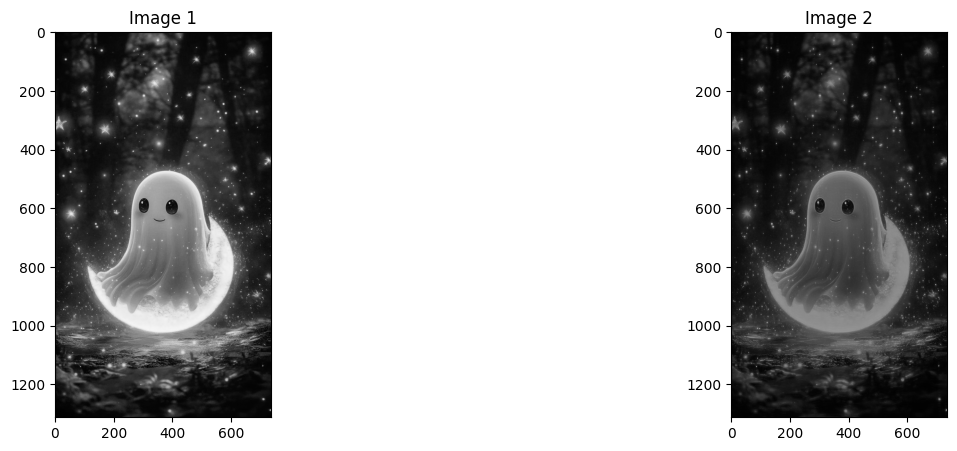

In [16]:
img_gray = img2_gray.astype(np.float32) / 255.0
enhanced_freq = image_inverse.astype(np.float32) / 255.0

alpha = 0.7
beta = 0.5

enhanced_image = cv.addWeighted(img_gray, alpha, enhanced_freq, beta, 0)

ShowTwoImages(img2_gray, enhanced_image)

## Discrete Cosine Transform (DCT)

In two dimensions, the DCT can be expressed in the form [Pratt, 1978] [Gonzalez and Wintz, 1977]

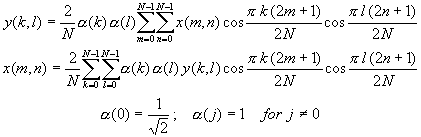

where x(m,n) is a N ×N field, k, l, m, n all range from 0 to N-1. Note that the transformation kernels are separable, so that the 2-D DCT can be conveniently performed in two steps, each of which involves a 1-D DCT. As in the one-dimensional case (Figure TC.3.1.1), DCT coding with an even symmetry end extension has fewer edge-effect problems than DFT image coding.

In [17]:
def dct2(a):
    import scipy
    return scipy.fftpack.dct( scipy.fftpack.dct( a, axis=0, norm='ortho' ), axis=1, norm='ortho' )

def idct2(a):
    import scipy
    return scipy.fftpack.idct( scipy.fftpack.idct( a, axis=0 , norm='ortho'), axis=1 , norm='ortho')

In [18]:
im = img3_gray
imsize = im.shape
dct = np.zeros(imsize)

# Do 8x8 DCT on image (in-place)
for i in np.r_[:imsize[0]:8]:
    for j in np.r_[:imsize[1]:8]:
        dct[i:(i+8),j:(j+8)] = dct2(im[i:(i+8),j:(j+8)])

Text(0.5, 1.0, 'An 8x8 DCT block')

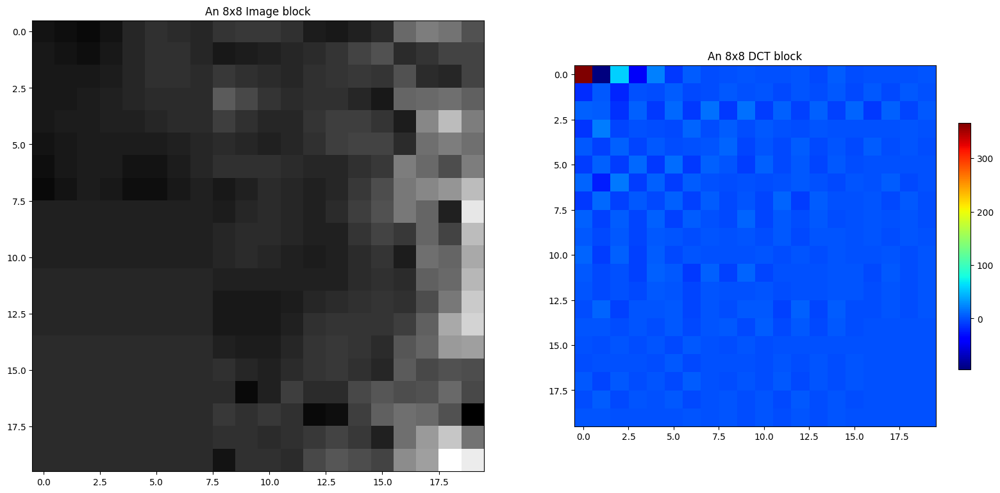

In [19]:
pos = 128
SampleBlock = im[pos:pos+20,pos:pos+20]
SampleDCT = dct2(SampleBlock)

plt.figure(figsize=(20,10))
plt.subplot(1,2,1)
plt.imshow(SampleBlock,cmap='gray')
plt.title( "An 8x8 Image block")

# Display the dct of that block
plt.subplot(1,2,2)
plt.imshow(SampleDCT,cmap=cm.jet,interpolation='nearest')
plt.colorbar(shrink=0.5)
plt.title( "An 8x8 DCT block")

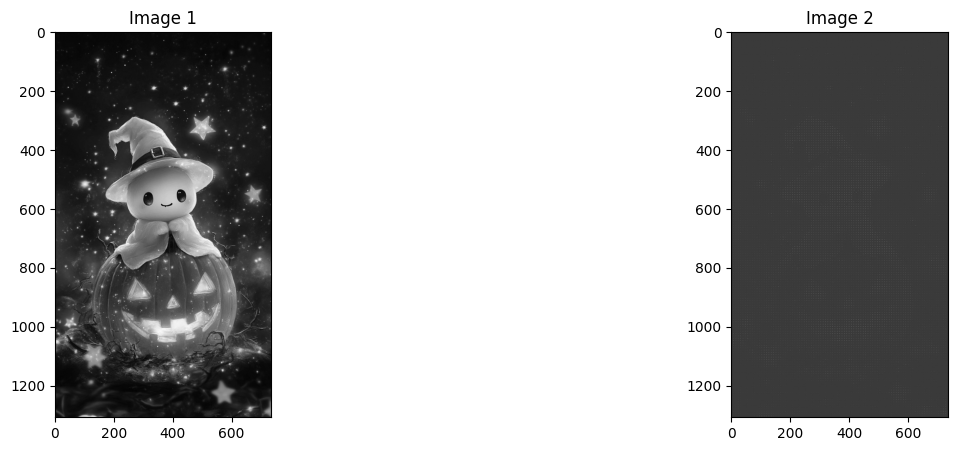

In [20]:
ShowTwoImages(img3_gray, dct)

## Apply threshold

Keeping only 5.039224% of the DCT coefficients
Comparison between original and DCT compressed images


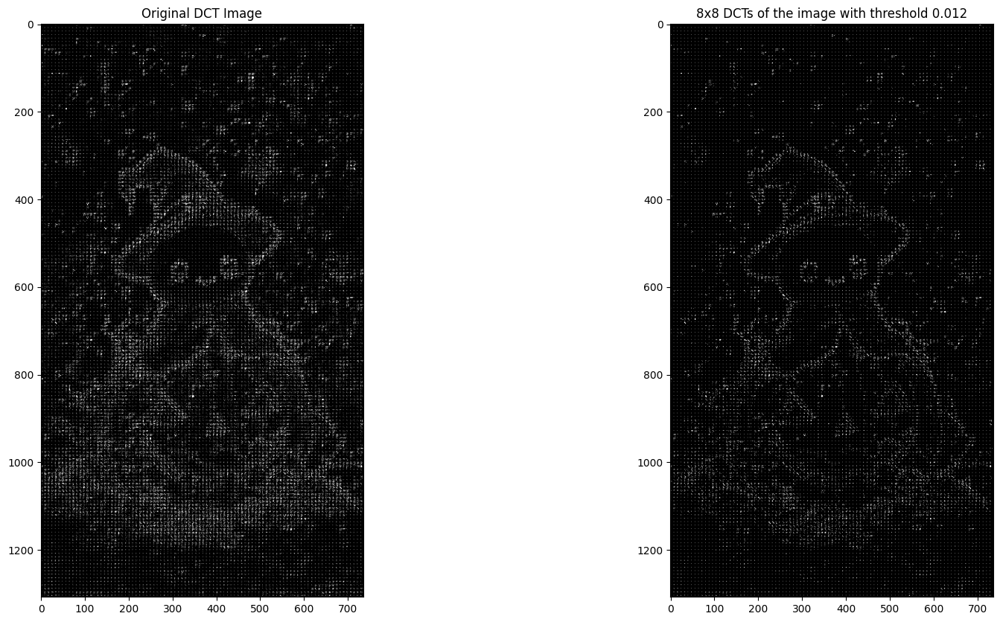

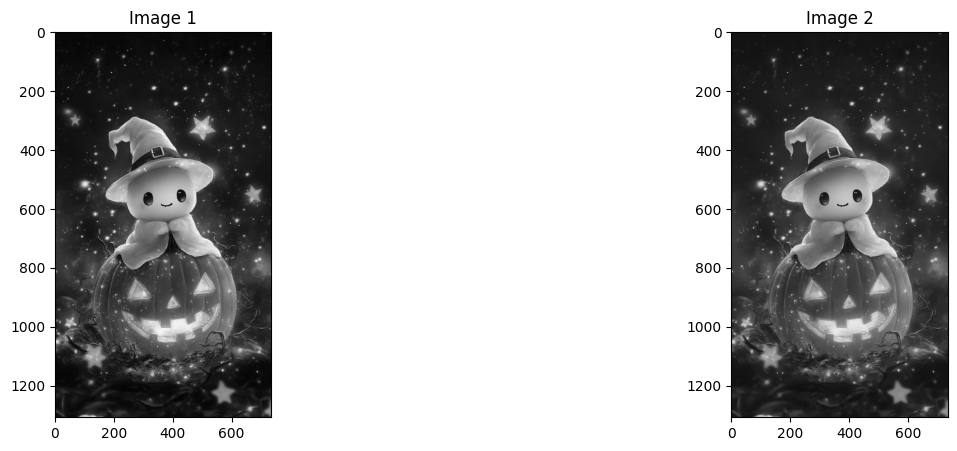

In [21]:
# Threshold
thresh = 0.012
dct_thresh = dct * (abs(dct) > (thresh*np.max(dct)))

plt.figure(figsize=(20,10))
plt.subplot(1,2,1)
plt.imshow(dct,cmap='gray',vmax = np.max(dct)*0.01,vmin = 0)
plt.title( "Original DCT Image")
plt.subplot(1,2,2)
plt.imshow(dct_thresh,cmap='gray',vmax = np.max(dct)*0.01,vmin = 0)
plt.title( "8x8 DCTs of the image with threshold " + str(thresh))


percent_nonzeros = np.sum( dct_thresh != 0.0 ) / (imsize[0]*imsize[1]*1.0)
print("Keeping only %f%% of the DCT coefficients" % (percent_nonzeros*100.0))

im_dct = np.zeros(imsize)
for i in np.r_[:imsize[0]:8]:
    for j in np.r_[:imsize[1]:8]:
        im_dct[i:(i+8),j:(j+8)] = idct2( dct_thresh[i:(i+8),j:(j+8)] )

print("Comparison between original and DCT compressed images" )
ShowTwoImages(im, im_dct)

Keeping only 5.039224% of the DCT coefficients
Keeping only 5.574911% of the DFT coefficients
Comparison between original, DCT compressed and DFT compressed images


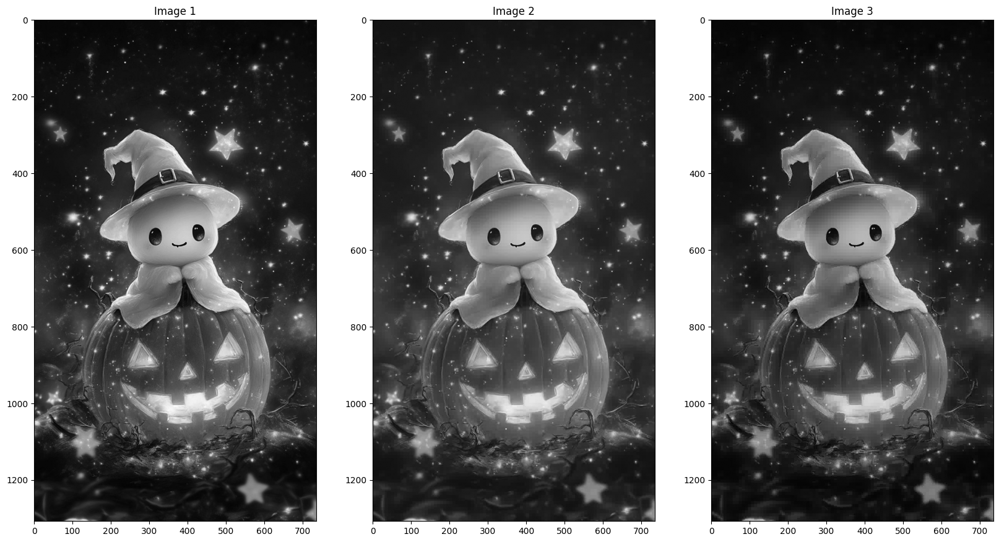

In [22]:
dft = np.zeros(imsize,dtype='complex');
im_dft = np.zeros(imsize,dtype='complex');

# 8x8 DFT
for i in np.r_[:imsize[0]:8]:
    for j in np.r_[:imsize[1]:8]:
        dft[i:(i+8),j:(j+8)] = np.fft.fft2( im[i:(i+8),j:(j+8)] )

# Thresh
thresh = 0.013
dft_thresh = dft * (abs(dft) > (thresh*np.max(abs(dft))))


percent_nonzeros_dft = np.sum( dft_thresh != 0.0 ) / (imsize[0]*imsize[1]*1.0)
print("Keeping only %f%% of the DCT coefficients" % (percent_nonzeros*100.0))
print("Keeping only %f%% of the DFT coefficients" % (percent_nonzeros_dft*100.0))

# 8x8 iDFT
for i in np.r_[:imsize[0]:8]:
    for j in np.r_[:imsize[1]:8]:
        im_dft[i:(i+8),j:(j+8)] = np.fft.ifft2( dft_thresh[i:(i+8),j:(j+8)] )

print("Comparison between original, DCT compressed and DFT compressed images")
ShowThreeImages(im, im_dct, abs(im_dft))

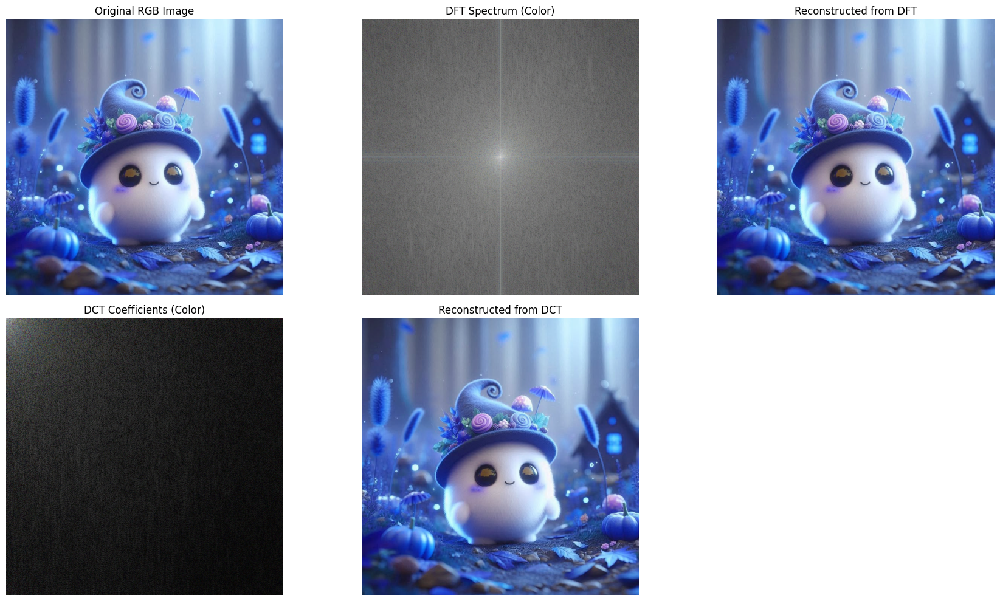

In [23]:
from scipy.fftpack import dct, idct



r, g, b = cv.split(img4)


r_dft = np.fft.fft2(r)
g_dft = np.fft.fft2(g)
b_dft = np.fft.fft2(b)


r_dft_shift = np.fft.fftshift(r_dft)
g_dft_shift = np.fft.fftshift(g_dft)
b_dft_shift = np.fft.fftshift(b_dft)


r_mag = 20 * np.log(np.abs(r_dft_shift) + 1)
g_mag = 20 * np.log(np.abs(g_dft_shift) + 1)
b_mag = 20 * np.log(np.abs(b_dft_shift) + 1)
dft_color = cv.merge([r_mag, g_mag, b_mag])

r_idft = np.abs(np.fft.ifft2(np.fft.ifftshift(r_dft_shift)))
g_idft = np.abs(np.fft.ifft2(np.fft.ifftshift(g_dft_shift)))
b_idft = np.abs(np.fft.ifft2(np.fft.ifftshift(b_dft_shift)))
img_idft = cv.merge([r_idft, g_idft, b_idft])

r_dct = dct(dct(np.float32(r).T, norm='ortho').T, norm='ortho')
g_dct = dct(dct(np.float32(g).T, norm='ortho').T, norm='ortho')
b_dct = dct(dct(np.float32(b).T, norm='ortho').T, norm='ortho')

r_dct_log = np.log(np.abs(r_dct) + 1)
g_dct_log = np.log(np.abs(g_dct) + 1)
b_dct_log = np.log(np.abs(b_dct) + 1)
dct_color = cv.merge([r_dct_log, g_dct_log, b_dct_log])


r_idct = idct(idct(r_dct.T, norm='ortho').T, norm='ortho')
g_idct = idct(idct(g_dct.T, norm='ortho').T, norm='ortho')
b_idct = idct(idct(b_dct.T, norm='ortho').T, norm='ortho')
img_idct = cv.merge([r_idct, g_idct, b_idct])


plt.figure(figsize=(18,10))

plt.subplot(2,3,1)
plt.imshow(img4)
plt.title("Original RGB Image")
plt.axis('off')

plt.subplot(2,3,2)
plt.imshow(np.uint8(255 * dft_color / np.max(dft_color)))
plt.title("DFT Spectrum (Color)")
plt.axis('off')

plt.subplot(2,3,3)
plt.imshow(np.uint8(np.clip(img_idft, 0, 255)))
plt.title("Reconstructed from DFT")
plt.axis('off')

plt.subplot(2,3,4)
plt.imshow(np.uint8(255 * dct_color / np.max(dct_color)))
plt.title("DCT Coefficients (Color)")
plt.axis('off')

plt.subplot(2,3,5)
plt.imshow(np.uint8(np.clip(img_idct, 0, 255)))
plt.title("Reconstructed from DCT")
plt.axis('off')

plt.tight_layout()
plt.show()


# Homework

## 1. Discrete Fourier Transform (DFT): Find an image from the Internet and perform the following steps:

  - Convert the image to grayscale.
  - Apply the DFT and display the frequency-domain image.
  - Write a function to apply a random mask onto the frequency-domain plot. Then:
    - Create a mask to remove high-frequency components and display the resulting texture image.
    - Create a mask to remove low-frequency components and display the resulting edge image.
    - Create and apply the following type of mask to modify the frequency domain, then output the reconstructed image:

  - Create a circular mask with a specified radius r, apply it to the frequency domain as described above, and display the resulting image.

  - Combine the frequency-filtered image with the original image to observe and discuss the results.

## 2. Discrete Cosine Transform (DCT): Find an image from the Internet and perform the following steps:
  - Convert the image to grayscale.
  - Apply the DCT and display the transformed (frequency-domain) image.
  - Experiment with both cv2.dct() in OpenCV and scipy.fftpack.dct() in SciPy. Compare and discuss any differences between the two implementations.

## 3. Apply Thresholding
  - Set a threshold to retain approximately 5% of the DCT and DFT coefficients. Then reconstruct and display the compressed image results.
  - Retain only a portion of the DCT coefficients (e.g., 10–20%) and analyze how the reconstructed image quality changes.
  - Conduct an experiment by keeping only the low-frequency coefficients (top-left corner of the DCT matrix). Compare this result with the case where coefficients are kept randomly — how do they differ?
  - Load an RGB image from the Internet and analyze how DCT and DFT behave differently across color channels:
    - Convert the image into different color spaces, such as HSV (Hue, Saturation, Value).
    - Separate the RGB and HSV images into their three individual channels (R, G, B and H, S, V).
      - Apply DCT or DFT to each channel separately.
      - Display the DCT results for each channel and their corresponding inverse-transformed images (IDCT/IDFT).
      - Which channel has the strongest concentration of low-frequency energy?
      - When retaining only 10% of DCT coefficients, which channel’s reconstructed image shows the most visible quality degradation?


## 4. Report
  - Display the original image alongside all processed images.
  - Write a short commentary comparing the visual differences between methods and describing your observations for each transformation.

----------------------------------------------------------
## 5. Bonus:
Create a custom frequency-domain mask as described above, apply it to modify the frequency content, and output the reconstructed image.

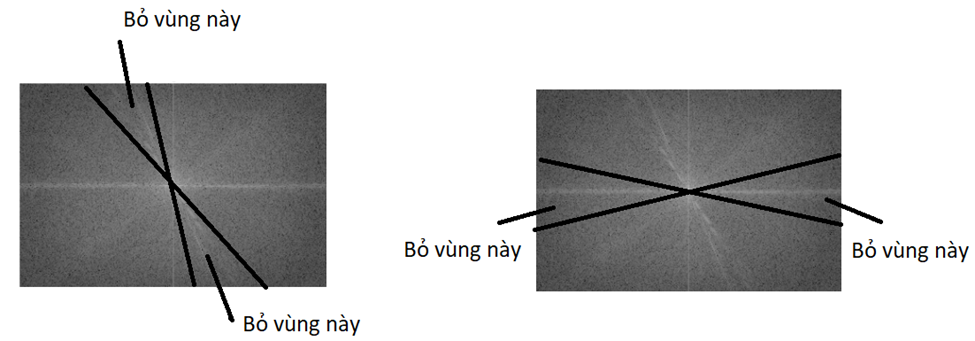



--------------------------------------------------------------------------

## 1. Discrete Fourier Transform (DFT): Find an image from the Internet and perform the following steps:

  - Convert the image to grayscale.
  - Apply the DFT and display the frequency-domain image.
  - Write a function to apply a random mask onto the frequency-domain plot. Then:
    - Create a mask to remove high-frequency components and display the resulting texture image.
    - Create a mask to remove low-frequency components and display the resulting edge image.
    - Create and apply the following type of mask to modify the frequency domain, then output the reconstructed image:

  - Create a circular mask with a specified radius r, apply it to the frequency domain as described above, and display the resulting image.

  - Combine the frequency-filtered image with the original image to observe and discuss the results.

In [112]:
import numpy as np
import pandas as pd
import cv2 as cv
from matplotlib import pyplot as plt
import matplotlib.cm as cm
import matplotlib.gridspec as gridspec
from pylab import imread
from skimage.color import rgb2gray
from scipy.fftpack import dct as sp_dct

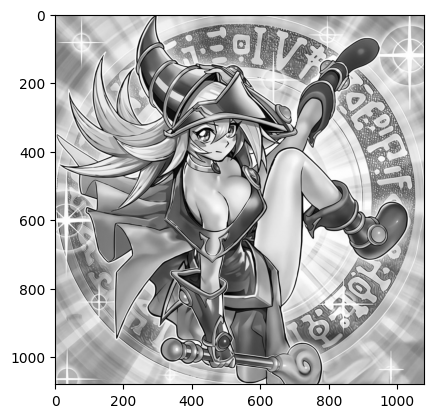

In [65]:
img_path = r"D:\Xu_ly_anh\content\dark magician girl.jpeg"
img = cv.imread(img_path)
img = cv.cvtColor(img, cv.COLOR_BGR2RGB)
img_gray = cv.cvtColor(img, cv.COLOR_RGB2GRAY)

plt.imshow(img_gray, cmap = 'gray')
plt.show()

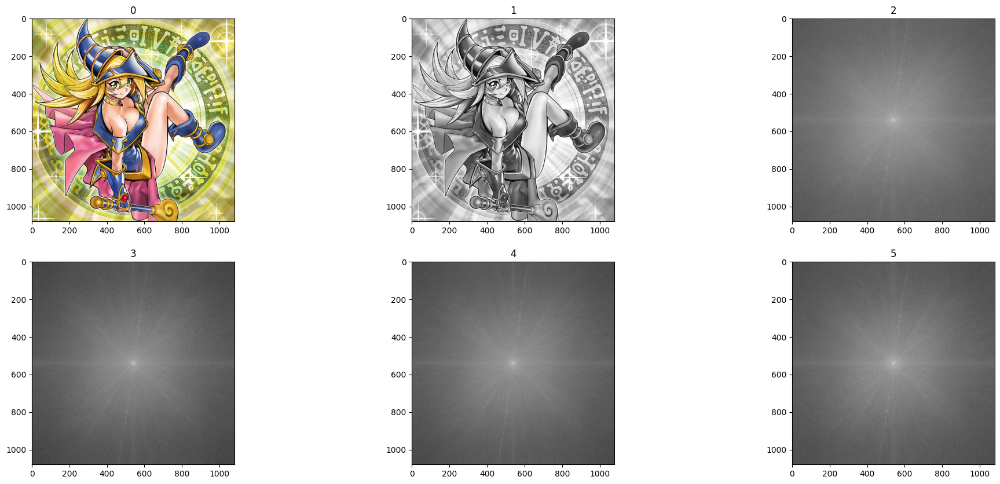

In [66]:
image_dft_frequency, dft_shift = DFT_Transformation(img_gray)
image_dft_frequency1, dft_shift1 = DFT_Transformation(img[:,:,0])
image_dft_frequency2, dft_shift2 = DFT_Transformation(img[:,:,1])
image_dft_frequency3, dft_shift3 = DFT_Transformation(img[:,:,2])
ShowListImages([img, img_gray,  image_dft_frequency, image_dft_frequency1, image_dft_frequency2, image_dft_frequency3], 2, 3)

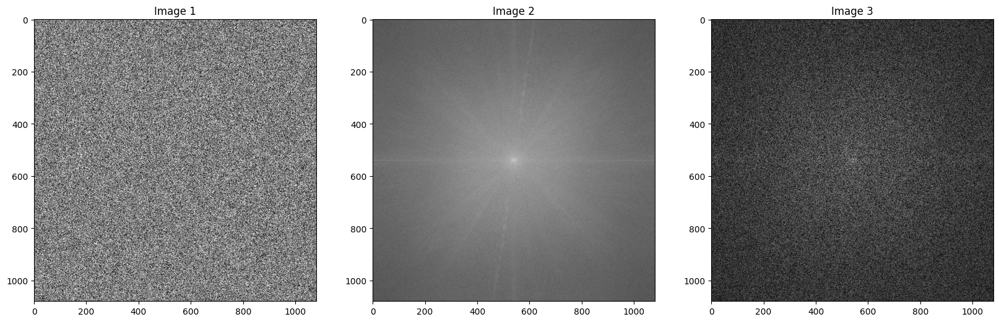

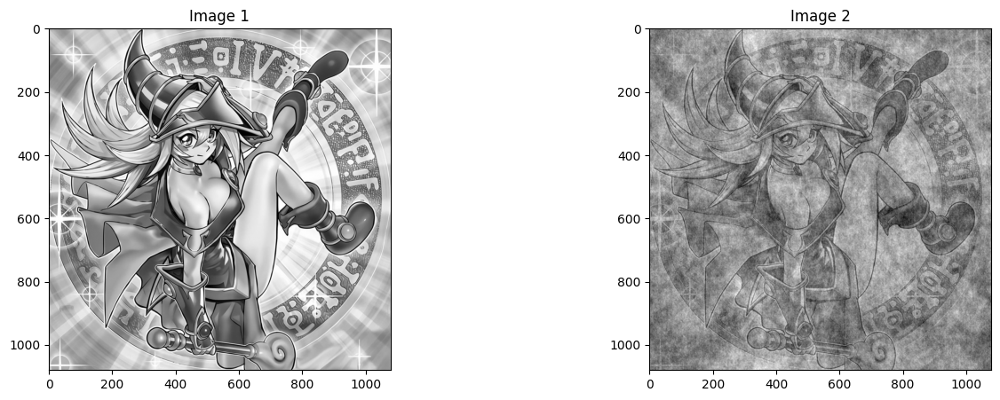

In [67]:
rows, cols = img_gray.shape
mask = np.random.choice([0, 1], size=(rows, cols), p=[0.5, 0.5])
mask = mask[:, :, np.newaxis]

image_dft_frequency_crop = image_dft_frequency * mask[:,:,0]

fshift = dft_shift * mask
f_ishift = np.fft.ifftshift(fshift)
img_inverse = cv.idft(f_ishift)
image_inverse = cv.magnitude(img_inverse[:,:,0],img_inverse[:,:,1])

ShowThreeImages(mask[:,:,0], image_dft_frequency, image_dft_frequency_crop)
ShowTwoImages(img_gray, image_inverse)

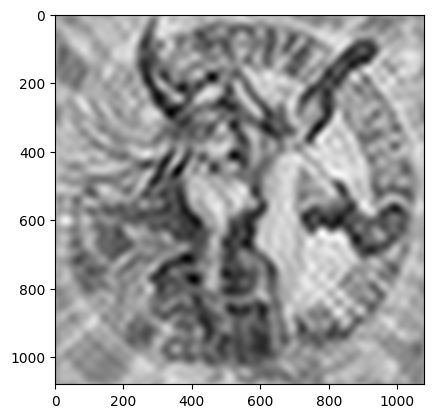

In [59]:
def mask1(img_gray):
    rows, cols = img_gray.shape
    crow,ccol = (int)(rows/2) , (int)(cols/2)

    mask = np.zeros((rows, cols, 2), np.uint8)
    size = 50
    mask[crow - size//2 : crow + size//2, ccol - size//2 : ccol + size//2] = 1
    
    fshift = dft_shift * mask
    f_ishift = np.fft.ifftshift(fshift)
    img_inverse = cv.idft(f_ishift)
    image_inverse = cv.magnitude(img_inverse[:,:,0],img_inverse[:,:,1])
    
    return image_inverse

plt.imshow(mask1(img_gray),cmap='gray')
plt.show()

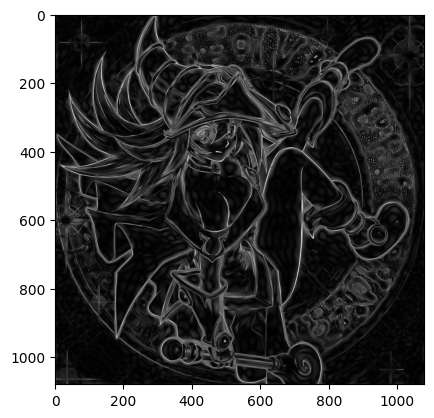

In [85]:
def mask2(img_gray):
    rows, cols = img_gray.shape
    crow, ccol = int(rows/2), int(cols/2)
    
    mask = np.ones((rows, cols, 2), np.uint8)
    size = 50
    mask[crow - size//2 : crow + size//2, ccol - size//2 : ccol + size//2] = 0
    
    fshift = dft_shift * mask
    f_ishift = np.fft.ifftshift(fshift)
    img_inverse = cv.idft(f_ishift)
    image_inverse = cv.magnitude(img_inverse[:,:,0], img_inverse[:,:,1])
    
    return image_inverse

plt.imshow(mask2(img_gray),cmap='gray')
plt.show()

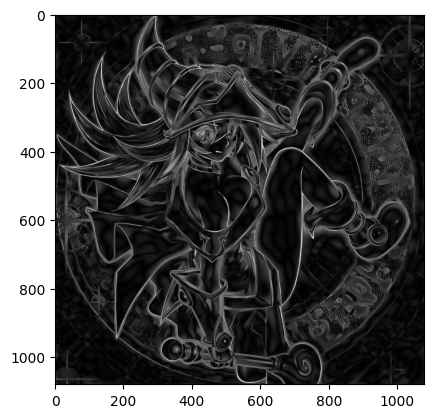

In [70]:
def mask3(img_gray):
    rows, cols = img_gray.shape
    crow, ccol = int(rows/2), int(cols/2)
    
    mask = np.ones((rows, cols, 2), np.uint8)
    size_outer = 80
    size_inner = 30
    mask[crow - size_outer//2 : crow + size_outer//2, ccol - size_outer//2 : ccol + size_outer//2] = 1
    mask[crow - size_inner//2 : crow + size_inner//2, ccol - size_inner//2 : ccol + size_inner//2] = 0
    
    fshift = dft_shift * mask
    f_ishift = np.fft.ifftshift(fshift)
    img_inverse = cv.idft(f_ishift)
    image_inverse = cv.magnitude(img_inverse[:,:,0], img_inverse[:,:,1])
    
    return image_inverse

plt.imshow(mask3(img_gray),cmap='gray')
plt.show()

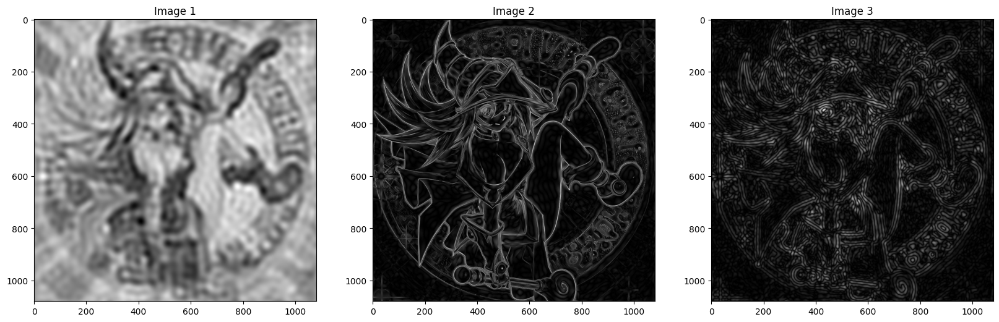

In [81]:
def mask1_circle(img_gray, radius):
    rows, cols = img_gray.shape
    crow, ccol = rows // 2, cols // 2
    
    mask = np.zeros((rows, cols, 2), np.uint8)
    cv.circle(mask, (ccol, crow), radius, (1, 1), -1)
    
    fshift = dft_shift * mask
    f_ishift = np.fft.ifftshift(fshift)
    img_inverse = cv.idft(f_ishift)
    image_inverse = cv.magnitude(img_inverse[:,:,0], img_inverse[:,:,1])
    
    return image_inverse

def mask2_circle(img_gray, radius):
    rows, cols = img_gray.shape
    crow, ccol = rows // 2, cols // 2
    
    mask = np.ones((rows, cols, 2), np.uint8)
    cv.circle(mask, (ccol, crow), radius, (0, 0), -1)
    
    fshift = dft_shift * mask
    f_ishift = np.fft.ifftshift(fshift)
    img_inverse = cv.idft(f_ishift)
    image_inverse = cv.magnitude(img_inverse[:,:,0], img_inverse[:,:,1])
    
    return image_inverse

def mask3_circle(img_gray, radius1, radius2):
    rows, cols = img_gray.shape
    crow, ccol = rows // 2, cols // 2
    
    mask = np.zeros((rows, cols, 2), np.uint8)
    cv.circle(mask, (ccol, crow), radius2, (1, 1), -1)
    cv.circle(mask, (ccol, crow), radius1, (0, 0), -1)
    
    fshift = dft_shift * mask
    f_ishift = np.fft.ifftshift(fshift)
    img_inverse = cv.idft(f_ishift)
    image_inverse = cv.magnitude(img_inverse[:,:,0], img_inverse[:,:,1])
    
    return image_inverse
ShowThreeImages(mask1_circle(img_gray, 30), mask2_circle(img_gray, 30), mask3_circle(img_gray, 30, 80))

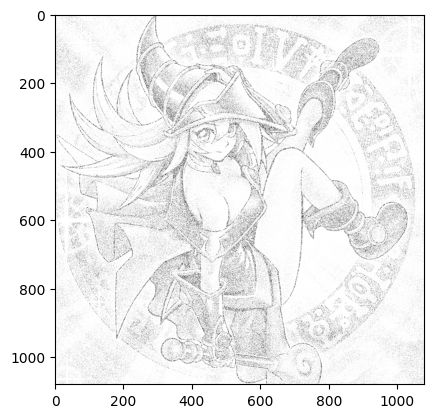

In [99]:
img_combine = cv.addWeighted(img_gray, 1.0, np.uint8(mask2(img_gray)), 1.5, 0)
plt.imshow(img_combine, cmap='gray')
plt.show()

## 2. Discrete Cosine Transform (DCT): Find an image from the Internet and perform the following steps:
  - Convert the image to grayscale.
  - Apply the DCT and display the transformed (frequency-domain) image.
  - Experiment with both cv2.dct() in OpenCV and scipy.fftpack.dct() in SciPy. Compare and discuss any differences between the two implementations.

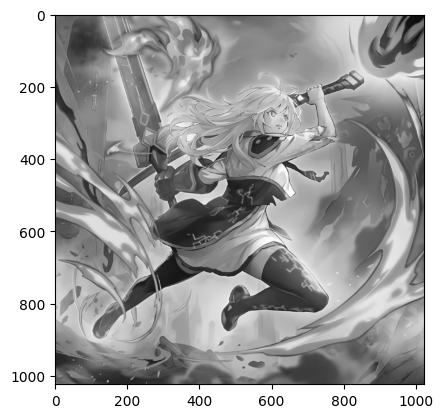

In [101]:
img2_path = r"D:\Xu_ly_anh\content\sky striker.png"
img2 = cv.imread(img_path)
img2 = cv.cvtColor(img, cv.COLOR_BGR2RGB)
img2_gray = cv.cvtColor(img2, cv.COLOR_RGB2GRAY)

plt.imshow(img2_gray, cmap = 'gray')
plt.show()

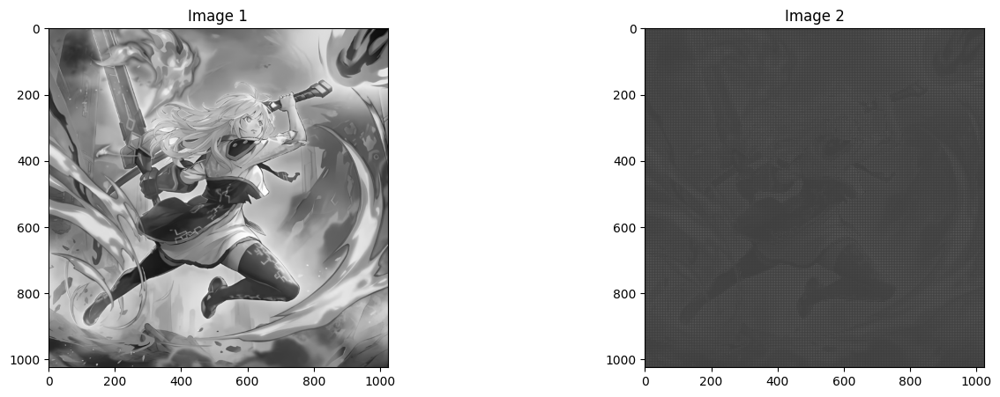

In [105]:
im = img2_gray
imsize = im.shape
dct = np.zeros(imsize)

for i in np.r_[:imsize[0]:4]:
    for j in np.r_[:imsize[1]:4]:
        dct[i:(i+4),j:(j+4)] = dct2(im[i:(i+4),j:(j+4)])

ShowTwoImages(img2_gray, dct)

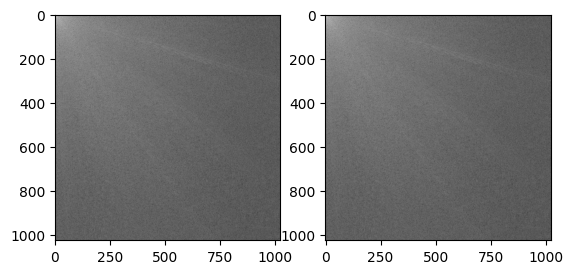

In [116]:
img_float = img2_gray.astype(np.float32) / 255.0
dct_opencv = cv.dct(img_float)

dct_scipy_rows = sp_dct(img_float, type=2, axis=1, norm='ortho')
dct_scipy = sp_dct(dct_scipy_rows, type=2, axis=0, norm='ortho')

dct_opencv = np.log(np.abs(dct_opencv) + 1e-5)
dct_scipy = np.log(np.abs(dct_scipy) + 1e-5)

plt.subplot(1, 2, 1)
plt.imshow(dct_opencv, cmap='gray')

plt.subplot(1, 2, 2)
plt.imshow(dct_scipy, cmap='gray')
plt.show()

## 3. Apply Thresholding
  - Set a threshold to retain approximately 5% of the DCT and DFT coefficients. Then reconstruct and display the compressed image results.
  - Retain only a portion of the DCT coefficients (e.g., 10–20%) and analyze how the reconstructed image quality changes.
  - Conduct an experiment by keeping only the low-frequency coefficients (top-left corner of the DCT matrix). Compare this result with the case where coefficients are kept randomly — how do they differ?
  - Load an RGB image from the Internet and analyze how DCT and DFT behave differently across color channels:
    - Convert the image into different color spaces, such as HSV (Hue, Saturation, Value).
    - Separate the RGB and HSV images into their three individual channels (R, G, B and H, S, V).
      - Apply DCT or DFT to each channel separately.
      - Display the DCT results for each channel and their corresponding inverse-transformed images (IDCT/IDFT).
      - Which channel has the strongest concentration of low-frequency energy?
      - When retaining only 10% of DCT coefficients, which channel’s reconstructed image shows the most visible quality degradation?

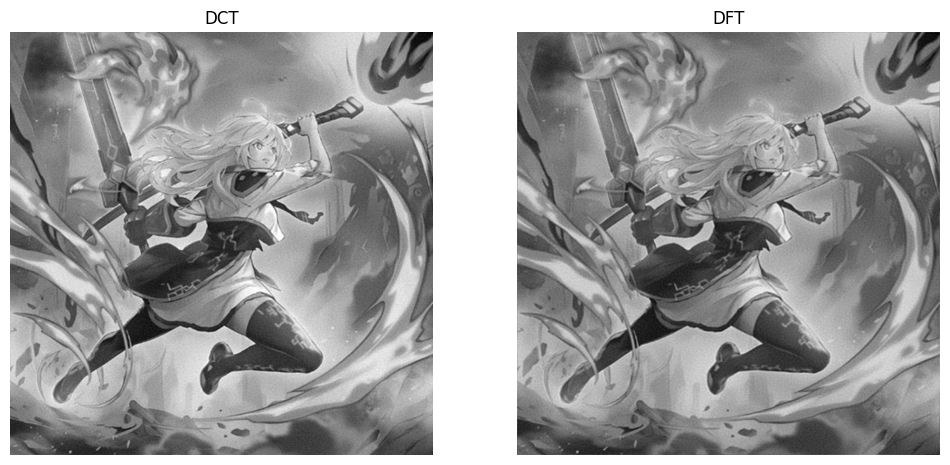

In [122]:
def set_5_DCT_DFT(img):
    
    img_float = img.astype(np.float32) / 255.0
    DCT = cv.dct(img_float)
    thresh_dct = np.percentile(np.abs(DCT), (1 - 0.05) * 100)
    mask_dct = np.abs(DCT) > thresh_dct
    dct_filtered = DCT * mask_dct
    img_dct_recon = cv.idct(dct_filtered)
    img_dct_result = np.uint8(np.clip(img_dct_recon * 255, 0, 255))

    _, dft_shift = DFT_Transformation(img)
    mag_raw = cv.magnitude(dft_shift[:,:,0], dft_shift[:,:,1])
    thresh_dft = np.percentile(mag_raw, (1 - 0.05) * 100)
    mask_dft = mag_raw > thresh_dft
    mask_dft_2ch = np.repeat(mask_dft[:, :, np.newaxis], 2, axis=2)
    dft_compressed = dft_shift * mask_dft_2ch
    

    f_ishift = np.fft.ifftshift(dft_compressed)
    img_back = cv.idft(f_ishift)
    img_dft_result = cv.magnitude(img_back[:,:,0], img_back[:,:,1])
    cv.normalize(img_dft_result, img_dft_result, 0, 255, cv.NORM_MINMAX)
    img_dft_result = np.uint8(img_dft_result)

    plt.figure(figsize=(12, 6))
    
    plt.subplot(1, 2, 1)
    plt.imshow(img_dct_result, cmap='gray')
    plt.title("DCT")
    plt.axis('off')
    
    plt.subplot(1, 2, 2)
    plt.imshow(img_dft_result, cmap='gray')
    plt.title("DFT")
    plt.axis('off')
    
    plt.show()
    return

set_5_DCT_DFT(img2_gray)

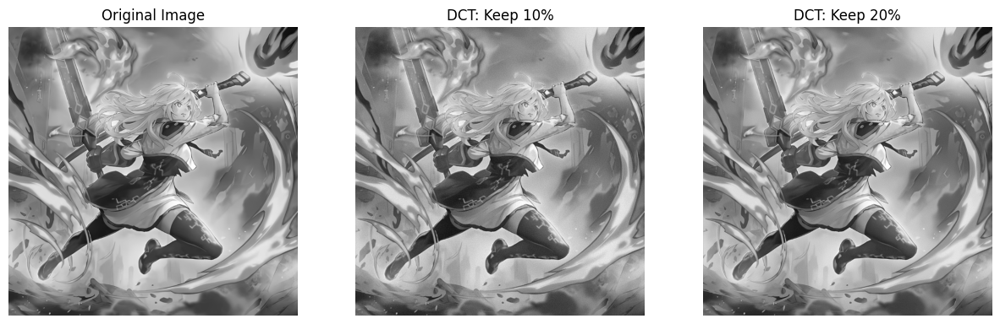

In [126]:
def analyze_dct_quality(img, keep_percents=[0.1, 0.2]):
    
    img_float = img.astype(np.float32) / 255.0
    
    dct_coeff = cv.dct(img_float)
    dct_abs = np.abs(dct_coeff)
    
    plt.figure(figsize=(15, 5))
    plt.subplot(1, 3, 1)
    plt.imshow(img, cmap='gray')
    plt.title("Original Image")
    plt.axis('off')
    
    threshold = np.percentile(dct_abs, (1 - 0.1) * 100)
    mask = dct_abs > threshold
    dct_filtered = dct_coeff * mask
        
    img_recon = cv.idct(dct_filtered)
    img_recon = np.uint8(np.clip(img_recon * 255, 0, 255))
        
    plt.subplot(1, 3, 2)
    plt.imshow(img_recon, cmap='gray')
    plt.title(f"DCT: Keep 10%")
    plt.axis('off')

    threshold = np.percentile(dct_abs, (1 - 0.2) * 100)
    mask = dct_abs > threshold
    dct_filtered = dct_coeff * mask
        
    img_recon = cv.idct(dct_filtered)
    img_recon = np.uint8(np.clip(img_recon * 255, 0, 255))
        
    plt.subplot(1, 3, 3)
    plt.imshow(img_recon, cmap='gray')
    plt.title(f"DCT: Keep 20%")
    plt.axis('off')

    plt.show()

analyze_dct_quality(img2_gray)

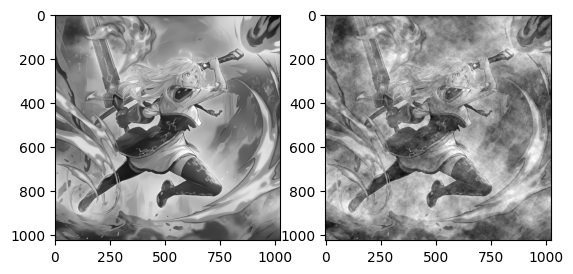

In [139]:
def top_left_vs_random_DCT(img, keep_percent):
    img_float = img.astype(np.float32) / 255.0
    
    rows, cols = img.shape
    total_pixels = rows * cols
    keep_count = int(total_pixels * keep_percent)
    dct_coeff = cv.dct(img_float)
    mask_low_freq = np.zeros_like(dct_coeff)
    k = int(np.sqrt(keep_count))
    row_limit = min(rows, k)
    col_limit = min(cols, k)
    
    mask_low_freq[0:row_limit, 0:col_limit] = 1
    
    dct_low = dct_coeff * mask_low_freq
    img_low = cv.idct(dct_low)
    img_low = np.clip(img_low * 255, 0, 255).astype(np.uint8)

    mask_random = np.zeros(total_pixels, dtype=np.float32)
    indices = np.random.choice(total_pixels, keep_count, replace=False)
    mask_random[indices] = 1
    mask_random = mask_random.reshape((rows, cols))
    
    dct_random = dct_coeff * mask_random
    img_random = cv.idct(dct_random)
    img_random = np.clip(img_random * 255, 0, 255).astype(np.uint8)

    plt.subplot(1, 2, 1)
    plt.imshow(img_low, cmap='gray')
    
    plt.subplot(1, 2, 2)
    plt.imshow(img_random, cmap='gray')
    plt.show()

top_left_vs_random_DCT(img2_gray, 0.8)

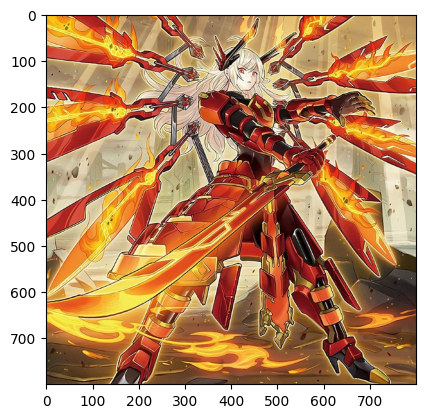

In [143]:
img3_path = r"D:\Xu_ly_anh\content\sky striker 2.jpeg"
img3 = cv.imread(img3_path)
img3 = cv.cvtColor(img3, cv.COLOR_BGR2RGB)
img3_gray = cv.cvtColor(img3, cv.COLOR_RGB2GRAY)

plt.imshow(img3)
plt.show()

In [146]:
def get_spectrum_dct(channel):
    """Computes Log-scale DCT spectrum."""
    img_float = channel.astype(np.float32) / 255.0
    dct = cv.dct(img_float)
    dct_log = np.log(np.abs(dct) + 1)
    return dct_log

def get_spectrum_dft(channel):
    """Computes Log-scale DFT spectrum (Centered)."""
    img_float = channel.astype(np.float32) / 255.0
    dft = cv.dft(img_float, flags=cv.DFT_COMPLEX_OUTPUT)
    dft_shift = np.fft.fftshift(dft)
    magnitude = cv.magnitude(dft_shift[:,:,0], dft_shift[:,:,1])
    dft_log = np.log(magnitude + 1)
    return dft_log

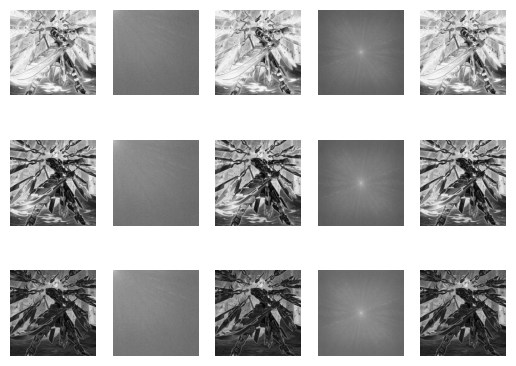

In [157]:
R, G, B = cv.split(img3)
channels = [R, G, B]

for i, channel in enumerate(channels):
    img_float = channel.astype(np.float32) / 255.0
    
    plt.subplot(3, 5, i * 5 + 1)
    plt.imshow(channel, cmap='gray')
    plt.axis('off')

    dct_coeff = cv.dct(img_float)
    dct_spec = np.log(np.abs(dct_coeff) + 1e-5)
    dct_spec = cv.normalize(dct_spec, None, 0, 1, cv.NORM_MINMAX)
    
    idct = cv.idct(dct_coeff)
    idct = np.clip(idct * 255, 0, 255).astype(np.uint8)

    plt.subplot(3, 5, i * 5 + 2)
    plt.imshow(dct_spec, cmap='gray')
    plt.axis('off')
    
    plt.subplot(3, 5, i * 5 + 3)
    plt.imshow(idct, cmap='gray')
    plt.axis('off')

    dft_coeff = cv.dft(img_float, flags=cv.DFT_COMPLEX_OUTPUT)
    dft_shift = np.fft.fftshift(dft_coeff)
    
    mag = cv.magnitude(dft_shift[:,:,0], dft_shift[:,:,1])
    dft_spec = np.log(mag + 1e-5)
    dft_spec = cv.normalize(dft_spec, None, 0, 1, cv.NORM_MINMAX)
    
    f_ishift = np.fft.ifftshift(dft_shift)
    img_back = cv.idft(f_ishift)
    idft = cv.magnitude(img_back[:,:,0], img_back[:,:,1])
    idft = cv.normalize(idft, None, 0, 255, cv.NORM_MINMAX).astype(np.uint8)
    
    plt.subplot(3, 5, i * 5 + 4)
    plt.imshow(dft_spec, cmap='gray')
    plt.axis('off')

    plt.subplot(3, 5, i * 5 + 5)
    plt.imshow(idft, cmap='gray')
    plt.axis('off')

plt.show()

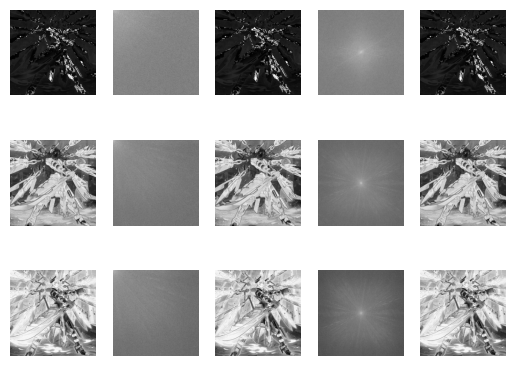

In [156]:
img3_hsv = cv.cvtColor(img3, cv.COLOR_RGB2HSV)
H, S, V = cv.split(img3_hsv)
channels = [H, S, V]

for i, channel in enumerate(channels):
    img_float = channel.astype(np.float32) / 255.0
    
    plt.subplot(3, 5, i * 5 + 1)
    plt.imshow(channel, cmap='gray')
    plt.axis('off')

    dct_coeff = cv.dct(img_float)
    dct_spec = np.log(np.abs(dct_coeff) + 1e-5)
    dct_spec = cv.normalize(dct_spec, None, 0, 1, cv.NORM_MINMAX)
    
    idct = cv.idct(dct_coeff)
    idct = np.clip(idct * 255, 0, 255).astype(np.uint8)

    plt.subplot(3, 5, i * 5 + 2)
    plt.imshow(dct_spec, cmap='gray')
    plt.axis('off')
    
    plt.subplot(3, 5, i * 5 + 3)
    plt.imshow(idct, cmap='gray')
    plt.axis('off')

    dft_coeff = cv.dft(img_float, flags=cv.DFT_COMPLEX_OUTPUT)
    dft_shift = np.fft.fftshift(dft_coeff)
    
    mag = cv.magnitude(dft_shift[:,:,0], dft_shift[:,:,1])
    dft_spec = np.log(mag + 1e-5)
    dft_spec = cv.normalize(dft_spec, None, 0, 1, cv.NORM_MINMAX)
    
    f_ishift = np.fft.ifftshift(dft_shift)
    img_back = cv.idft(f_ishift)
    idft = cv.magnitude(img_back[:,:,0], img_back[:,:,1])
    idft = cv.normalize(idft, None, 0, 255, cv.NORM_MINMAX).astype(np.uint8)
    
    plt.subplot(3, 5, i * 5 + 4)
    plt.imshow(dft_spec, cmap='gray')
    plt.axis('off')

    plt.subplot(3, 5, i * 5 + 5)
    plt.imshow(idft, cmap='gray')
    plt.axis('off')

plt.show()